# Car damage detection using Detectron2 model (Mask R CNN)

You can find the dataset here: https://humansintheloop.org/resources/datasets/car-parts-and-car-damages-dataset/

You can find the model here : https://github.com/facebookresearch/detectron2

Library imports and creation of working datasets

In [ ]:
azureml-mlflow
mlflow

In [1]:
import sys, os, json, random

import sys
import datetime

import cv2

import numpy as np
import pandas as pd

import skimage.io as io

import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = [16,9]
%matplotlib inline

from shapely.geometry import Polygon

# path to the images
data_dir = "cardamage"
img_dir_coco = "cocodata"

# create paths for traininig and validaiton data
os.makedirs("working_multiclass/data/", exist_ok=True)
os.makedirs("working_multiclass/data/train/", exist_ok=True)
os.makedirs("working_multiclass/data/val/", exist_ok=True)

# create path to store the model config
os.makedirs("working_multiclass/model/", exist_ok=True)

data_working_dir = "working_multiclass/data/"
model_dir = "working_multiclass/model/"

In [2]:
classes = ['Cracked', 'Scratch', 'Flaking', 'Broken part', 'Corrosion', 'Dent','Paint chip','Missing part']
# Iterate over the annotation files and convert the annotations to COCO JSON format.

# fraction of images for training/validation: 80/20
train_frac = 0.9  # debug: 1-0.005

json_dir = os.path.join(data_dir, "ann/")

# annotations for train/val data
annotations_list_train = []
annotations_list_val = []
images_list_train = []
images_list_val = []

# create a dict with class ids
class_to_label = {class_name: i for i, class_name in enumerate(classes)}

# convert polygon annotations to COCO-style bounding boxes
def polygon_to_box(polygon) -> list:
    """Convert 1 polygon into a bounding box.

    # Arguments
      polygon: a numpy array of shape (N, 2) representing N vertices
               of the hand segmentation label (polygon); each vertex
               is a point: (x, y)
    """
    if len(polygon) < 3:  # a polygon has at least 3 vertices
        return None
    
    x_min = np.min(polygon[:, 0])
    x_max = np.max(polygon[:, 0])
    y_min = np.min(polygon[:, 1])
    y_max = np.max(polygon[:, 1])
    H = y_max - y_min
    W = x_max - x_min
    
    return [x_min, y_min, W, H]  # "bbox_mode": BoxMode.XYWH_ABS

def segments_to_area(seg_pairs):
    pgon = Polygon(seg_pairs)
    
    return pgon.area


# iterate through the annotations
for idx, filename in enumerate(os.listdir(json_dir)):
    if filename.endswith(".json"):
        is_train = np.random.choice([0,1], size=1, p=[1-train_frac, train_frac])[0]  # use image for training

        with open(os.path.join(json_dir, filename)) as f:
            ann_data = json.load(f)
            image_filename = filename.replace(".json", "")
            image_path = os.path.join(data_dir, "img", image_filename)
            image = {
                "file_name": image_filename,
                "height": ann_data["size"]["height"],
                "width": ann_data["size"]["width"]
                }
            if is_train:
                train_image_id = len(images_list_train)
                image["id"] = train_image_id
                images_list_train.append(image)
            else:
                val_image_id = len(images_list_val)
                image["id"] = val_image_id
                images_list_val.append(image)
                
            for o in ann_data["objects"]:
                label = o["classTitle"]
                    
                class_id = class_to_label[label]
                bbox = polygon_to_box(np.array(o["points"]["exterior"]))

                annotation = {
                    "category_id": class_id+1,
                    "iscrowd": 0,
                    "bbox": bbox,
                    "area": segments_to_area(o["points"]["exterior"]),
                    "segmentation": [np.array(o["points"]["exterior"]).ravel().tolist()]
                }
                
                if is_train:
                    annotation.update(
                        {
                        "id": len(annotations_list_train),
                        "image_id": train_image_id,
                        })
                    annotations_list_train.append(annotation)
                else:
                    annotation.update(
                        {
                        "id": len(annotations_list_val),
                        "image_id": val_image_id,
                        })
                    annotations_list_val.append(annotation)

# coco annotations for train/val
coco_data_train = {
    "annotations": annotations_list_train,
    "images": images_list_train,
    "categories": [{"id": class_id+1, "name": class_name} for class_name, class_id in class_to_label.items()]
}
coco_data_val = {
    "annotations": annotations_list_val,
    "images": images_list_val,
    "categories": [{"id": class_id+1, "name": class_name} for class_name, class_id in class_to_label.items()]
}

Data inspection

Number of images: 748
Number of annotations: 8409
Number of categories: 8
Annotations per category:
Corrosion: 251
Scratch: 3032
Broken part: 1379
Dent: 1528
Paint chip: 1255
Missing part: 577
Flaking: 320
Cracked: 67
Average number of annotations per image: 11.24


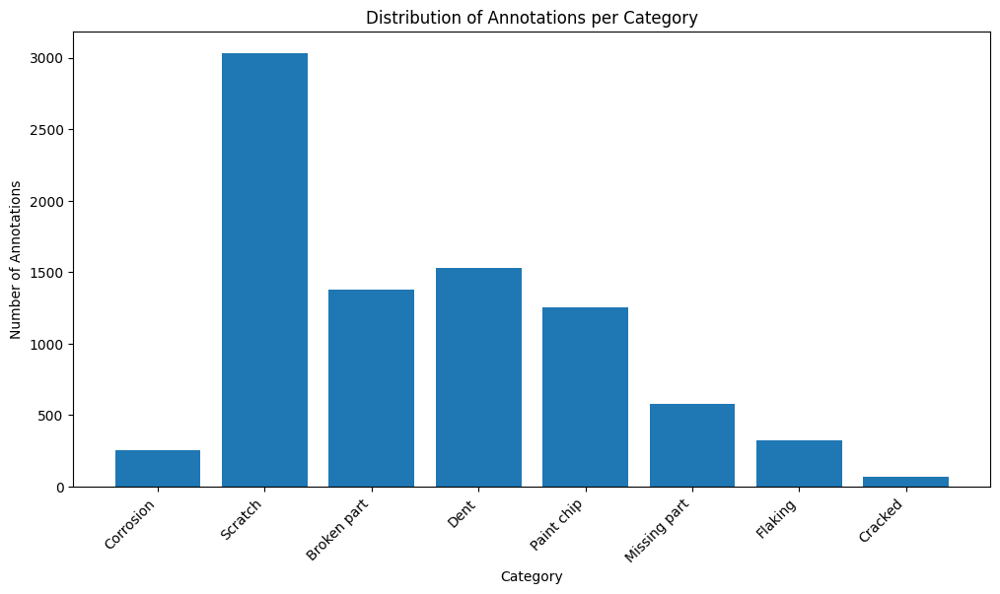

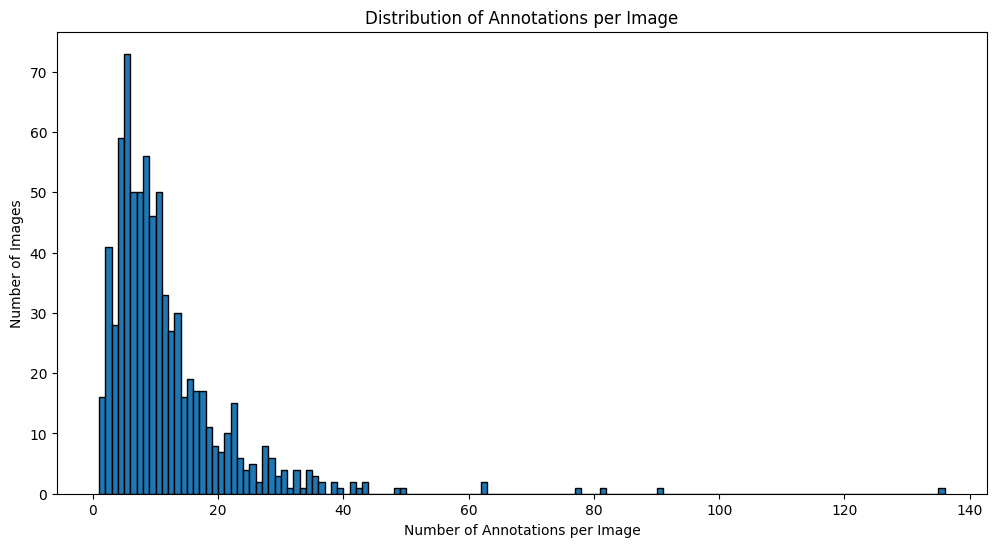

In [3]:
from collections import Counter
# 1. Count the number of images
num_images = len(coco_data_train["images"])
print(f"Number of images: {num_images}")

# 2. Count the number of annotations
num_annotations = len(coco_data_train["annotations"])
print(f"Number of annotations: {num_annotations}")

# 3. Count the number of categories
num_categories = len(coco_data_train["categories"])
print(f"Number of categories: {num_categories}")

# 4. Distribution of annotations per category
annotation_counts = Counter(annotation['category_id'] for annotation in coco_data_train["annotations"])
category_names = {category['id']: category['name'] for category in coco_data_train["categories"]}
category_annotation_counts = {category_names[cat_id]: count for cat_id, count in annotation_counts.items()}

# Print distribution
print("Annotations per category:")
for category, count in category_annotation_counts.items():
    print(f"{category}: {count}")

# 5. Distribution of annotations per image
image_annotation_counts = Counter(annotation['image_id'] for annotation in coco_data_train["annotations"])
image_counts = [count for _, count in image_annotation_counts.items()]

print(f"Average number of annotations per image: {sum(image_counts) / len(image_counts):.2f}")

# Plot distribution of annotations per category
plt.figure(figsize=(12, 6))
plt.bar(category_annotation_counts.keys(), category_annotation_counts.values())
plt.xlabel('Category')
plt.ylabel('Number of Annotations')
plt.title('Distribution of Annotations per Category')
plt.xticks(rotation=45, ha='right')
plt.show()

# Plot distribution of annotations per image
plt.figure(figsize=(12, 6))
plt.hist(image_counts, bins=range(1, max(image_counts) + 1), edgecolor='black')
plt.xlabel('Number of Annotations per Image')
plt.ylabel('Number of Images')
plt.title('Distribution of Annotations per Image')
plt.show()

Sample annotation (in COCO fomat)

In [4]:
{'annotations': coco_data_train['annotations'][0],
 'images': coco_data_train['images'][0],
 'categories': coco_data_train['categories']
}

{'annotations': {'category_id': 5,
  'iscrowd': 0,
  'bbox': [374.0, 238.0, 67.0, 56.0],
  'area': 704.5,
  'segmentation': [[432.0,
    294.0,
    438.0,
    288.0,
    441.0,
    277.0,
    437.0,
    269.0,
    433.0,
    256.0,
    425.0,
    243.0,
    412.0,
    238.0,
    389.0,
    239.0,
    374.0,
    244.0,
    377.0,
    254.0,
    396.0,
    245.0,
    408.0,
    243.0,
    414.0,
    246.0,
    427.0,
    258.0,
    430.0,
    263.0,
    431.0,
    272.0,
    432.0,
    280.0]],
  'id': 0,
  'image_id': 0},
 'images': {'file_name': 'Car damages 102.jpg',
  'height': 471,
  'width': 629,
  'id': 0},
 'categories': [{'id': 1, 'name': 'Cracked'},
  {'id': 2, 'name': 'Scratch'},
  {'id': 3, 'name': 'Flaking'},
  {'id': 4, 'name': 'Broken part'},
  {'id': 5, 'name': 'Corrosion'},
  {'id': 6, 'name': 'Dent'},
  {'id': 7, 'name': 'Paint chip'},
  {'id': 8, 'name': 'Missing part'}]}

In [5]:
# save coco annotations for train and validation data
coco_path_damage_train = f"{data_working_dir}/train/coco_annotations_damage.json"    # damage / no damage
coco_path_damage_val = f"{data_working_dir}/val/coco_annotations_damage.json"    # damage / no damage

# train annotations
with open(coco_path_damage_train, "w") as f:
    json.dump(coco_data_train, f, indent=4)


# val annotations
with open(coco_path_damage_val, "w") as f:
    json.dump(coco_data_val, f, indent=4)

In [6]:
dataset_dir_hitl_ann = "working_multiclass/data/"  # path to the annotations
dataset_dir_hitl_data = "cardamage/"  # path to the data
dataset_dir_coco = "cocodata"

img_dir = "img/"
train_dir = "train/"
val_dir = "val/"

# use 8 images from the first data set ("dataset_dir_coco") for model testing
test_dir = "test/"
test_dir = os.path.join(dataset_dir_coco, test_dir)

# img_dir_coco = os.path.join(dataset_dir_coco, img_dir)
img_dir_hitl = os.path.join(dataset_dir_hitl_data, img_dir)

ann_train_coco = os.path.join(dataset_dir_coco, train_dir, "COCO_train_annos.json")
ann_val_coco = os.path.join(dataset_dir_coco, val_dir, "COCO_val_annos.json")

ann_train_hitl = os.path.join(dataset_dir_hitl_ann, train_dir, "coco_annotations_damage.json")
ann_val_hitl = os.path.join(dataset_dir_hitl_ann, val_dir, "coco_annotations_damage.json")

In [7]:
from pycocotools.coco import COCO

# load annotations
coco_hitl = COCO(ann_train_hitl)

loading annotations into memory...
Done (t=0.12s)
creating index...
index created!


In [8]:
cats_hitl = coco_hitl.loadCats(coco_hitl.getCatIds())
nms_hitl = [cat['name'] for cat in cats_hitl]
print('COCO categories for damages (HITL): \n{}\n'.format(', '.join(nms_hitl)))

COCO categories for damages (HITL): 
Cracked, Scratch, Flaking, Broken part, Corrosion, Dent, Paint chip, Missing part



## Model

In [9]:
import detectron2
from detectron2 import model_zoo

from detectron2.config import get_cfg

from detectron2.utils.logger import setup_logger
from detectron2.utils.visualizer import Visualizer, ColorMode

from detectron2.engine import DefaultPredictor

from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances

# output training logs
setup_logger()

import torch, torchvision
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print(torch.__version__, torch.cuda.is_available())
print("detectron2:", detectron2.__version__)

2.4.0+cu118 False
detectron2: 0.6


In [10]:
# register both data sets which we will be using for model fine-tuning
# coco data set
register_coco_instances("car_dataset_coco_train", {}, ann_train_coco, image_root=img_dir_coco)
register_coco_instances("car_dataset_coco_val", {}, ann_val_coco, image_root=img_dir_coco)

# hitl data set
register_coco_instances("car_dataset_hitl_train", {}, ann_train_hitl, image_root=img_dir_hitl)
register_coco_instances("car_dataset_hitl_val", {}, ann_val_hitl, image_root=img_dir_hitl)

In [11]:
# Load images
dataset_dicts_coco = DatasetCatalog.get("car_dataset_coco_train")
metadata_dicts_coco = MetadataCatalog.get("car_dataset_coco_train")

dataset_dicts_hitl = DatasetCatalog.get("car_dataset_hitl_train")
metadata_dicts_hitl = MetadataCatalog.get("car_dataset_hitl_train")

[08/13 11:22:44 d2.data.datasets.coco]: Loaded 59 images in COCO format from cocodata\train/COCO_train_annos.json
[08/13 11:22:44 d2.data.datasets.coco]: Loaded 748 images in COCO format from working_multiclass/data/train/coco_annotations_damage.json


cardamage/img/Car damages 1146.png


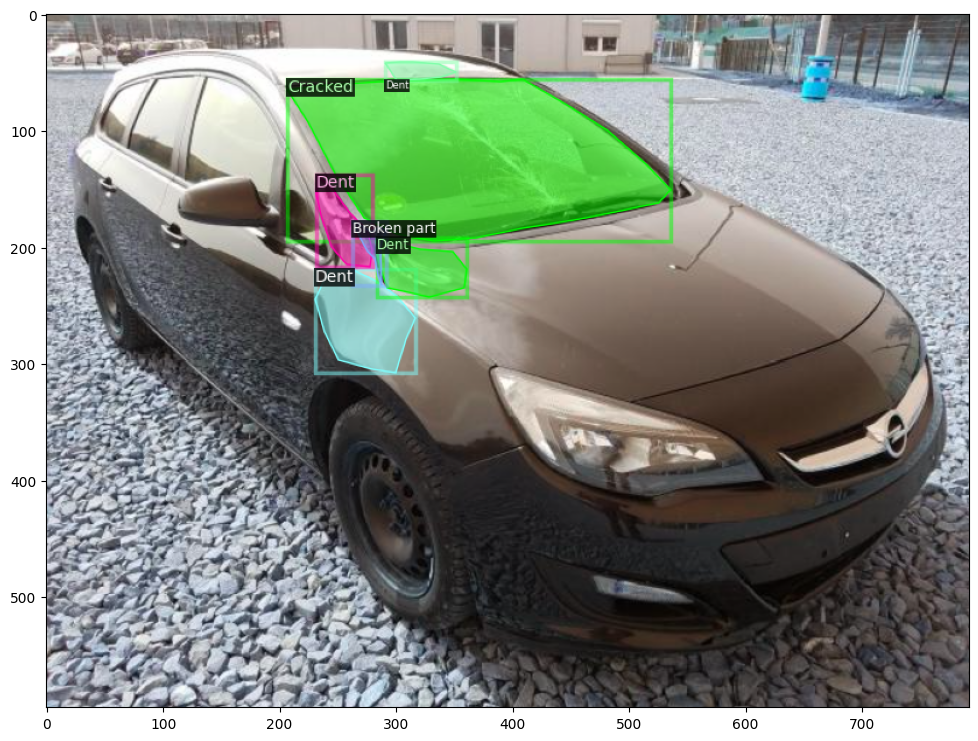

In [85]:
# Take the random images from training data sets and visualize the annotations for it
dd =  random.sample(dataset_dicts_hitl, 1)
for d in dd:
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=metadata_dicts_hitl, scale=1)  # pass metadata to draw class names and colours
    out = visualizer.draw_dataset_dict(d)
    print(d["file_name"])
    plt.imshow(out.get_image()[:, :, ::-1])
    plt.show()

In [14]:
cfg = get_cfg()
cfg.OUTPUT_DIR = f"{model_dir}output_{datetime.datetime.now().strftime('%Y%m%d_%T').replace(':', '')}"

cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))

cfg.DATASETS.TRAIN = ("car_dataset_hitl_train",)
cfg.DATASETS.TEST = ("car_dataset_hitl_val",)
cfg.DATALOADER.NUM_WORKERS = 4

#cfg.SOLVER.REFERENCE_WORLD_SIZE = 2  # should use both GPUs?

cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.MODEL.DEVICE='cpu'

cfg.SOLVER.WARMUP_ITERS = 20
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 1000
cfg.SOLVER.STEPS = []  # do not decay learning rate

cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 8   # images used to calculate cls and reg loss during training.
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(classes)  

cfg.TEST.EVAL_PERIOD = 200

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)



In [42]:
# # save config (in case we need to experiment with different hyper-parameters)
# with open(f"{cfg.OUTPUT_DIR}/mycfg.yaml", "w") as f: 
#    f.write(cfg.dump())

# print(f"Saved config: {cfg.OUTPUT_DIR}/mycfg.yaml")

Saved config: working_multiclass/model/output_20240805_183114/mycfg.yaml


In [31]:
from detectron2.engine import DefaultTrainer
# from cardamages_detectron2.tfboard_validation.trainer import Trainer
# from cardamages_detectron2.tfboard_validation.val_loss_hook import ValLossHook
from detectron2.engine import hooks

trainer = DefaultTrainer(cfg)

# Create a hook to calculate the validation loss on each iteration
# Register the hoooks
# trainer.register_hooks([hooks(cfg)])

periodic_writer_hook = [hook for hook in trainer._hooks if isinstance(hook, hooks.PeriodicWriter)]
all_other_hooks = [hook for hook in trainer._hooks if not isinstance(hook, hooks.PeriodicWriter)]
trainer._hooks = all_other_hooks + periodic_writer_hook

trainer.resume_or_load(resume=False)
trainer.optimizer = optimizer

trainer.train()

[08/05 18:31:19 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (9, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (9,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (32, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (32,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (8, 256, 1, 1) 

[08/05 18:31:20 d2.engine.train_loop]: Starting training from iteration 0


C:\Users\yturki004\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\functional.py:513: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\TensorShape.cpp:3610.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[08/05 18:44:49 d2.utils.events]:  eta: 10:17:45  iter: 19  total_loss: 4.721  loss_cls: 1.845  loss_box_reg: 0.4919  loss_mask: 0.6923  loss_rpn_cls: 1.406  loss_rpn_loc: 0.2675    time: 39.1849  last_time: 37.3008  data_time: 1.6220  last_data_time: 0.0030   lr: 0.00023751  
[08/05 18:57:56 d2.utils.events]:  eta: 10:12:52  iter: 39  total_loss: 2.826  loss_cls: 1.078  loss_box_reg: 0.6137  loss_mask: 0.6817  loss_rpn_cls: 0.2764  loss_rpn_loc: 0.223    time: 38.9740  last_time: 46.5621  data_time: 0.0037  last_data_time: 0.0035   lr: 0.00025  
[08/05 19:11:37 d2.utils.events]:  eta: 10:01:31  iter: 59  total_loss: 2.957  loss_cls: 0.95  loss_box_reg: 0.6887  loss_mask: 0.6608  loss_rpn_cls: 0.2658  loss_rpn_loc: 0.3157    time: 39.6734  last_time: 46.7751  data_time: 0.0038  last_data_time: 0.0050   lr: 0.00025  
[08/05 19:24:37 d2.utils.events]:  eta: 9:48:43  iter: 79  total_loss: 2.831  loss_cls: 0.9157  loss_box_reg: 0.7419  loss_mask: 0.6464  loss_rpn_cls: 0.2373  loss_rpn_loc:

In [16]:
#  Old model
model_path = "working_multiclass/model/model_default_1000"
# Current model
# model_path = cfg.OUTPUT_DIR
# cfg = get_cfg()
# cfg.merge_from_file("working_multiclass/model/model_default_1000/mycfg.yaml")
cfg.MODEL.WEIGHTS = os.path.join(model_path, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[08/13 11:23:27 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from working_multiclass/model/model_default_1000\model_final.pth ...


C:\Users\yturki004\AppData\Local\Programs\Python\Python311\Lib\site-packages\fvcore\common\checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load

In [17]:
# dataset_dicts_coco_val = DatasetCatalog.get("car_dataset_coco_val")
# metadata_dicts_coco_val = MetadataCatalog.get("car_dataset_coco_val")

dataset_dicts_hitl_val = DatasetCatalog.get("car_dataset_hitl_val")
metadata_dicts_hitl_val = MetadataCatalog.get("car_dataset_hitl_val")

[08/13 11:23:29 d2.data.datasets.coco]: Loaded 66 images in COCO format from working_multiclass/data/val/coco_annotations_damage.json


## Testing on Validation data (Different dataset)

In [14]:
type(metadata_dicts_hitl)

detectron2.data.catalog.Metadata

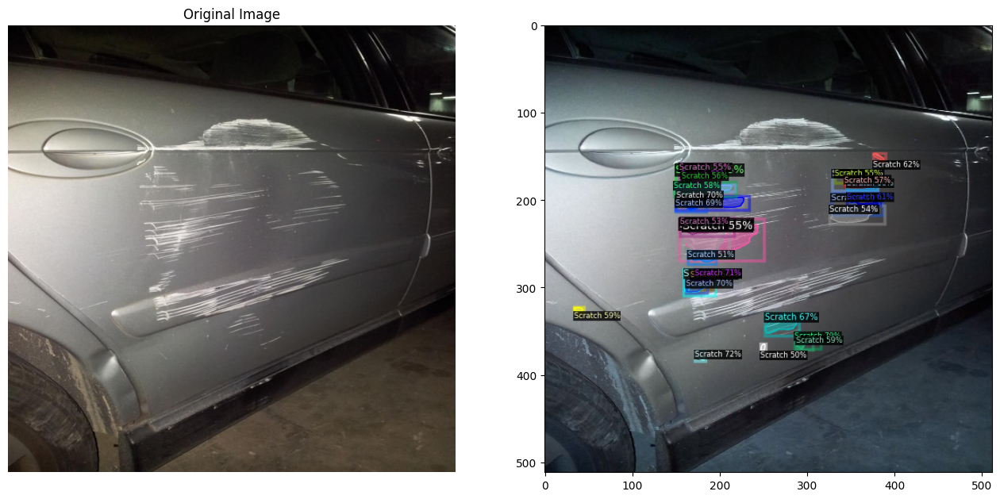

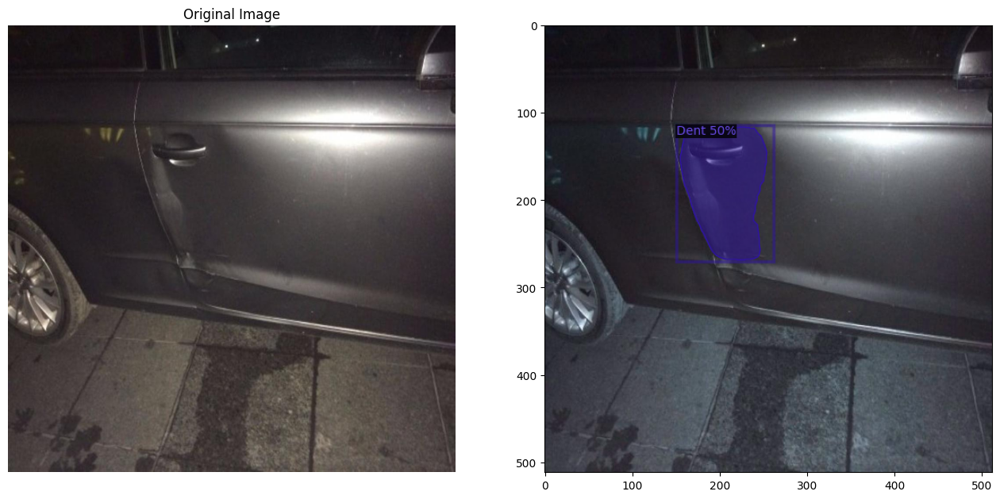

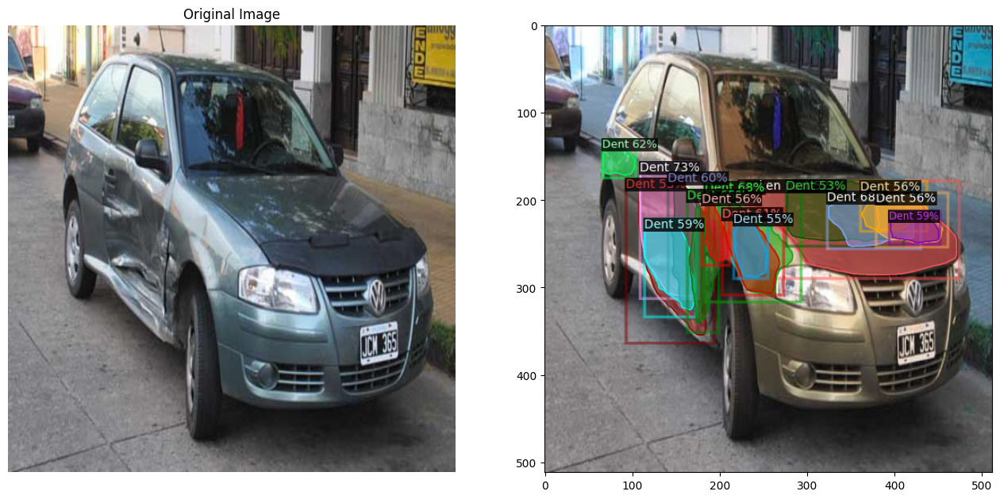

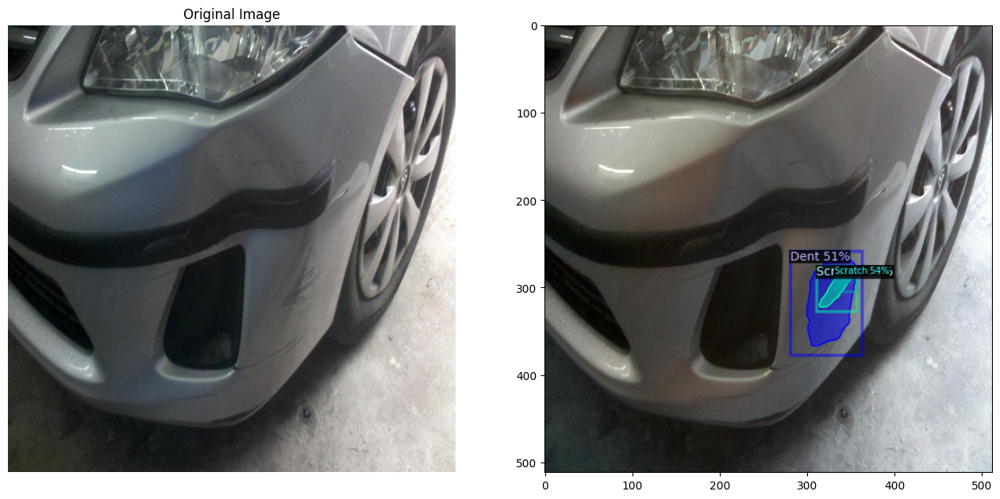

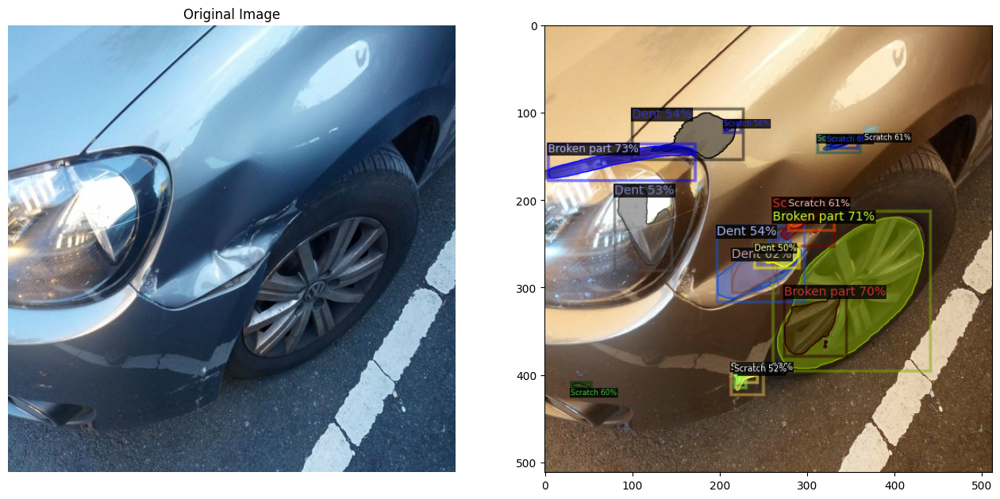

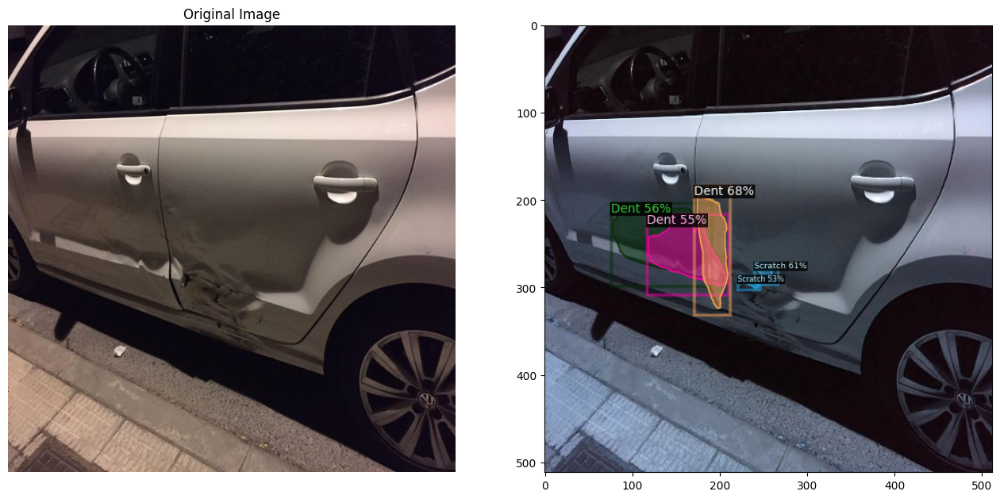

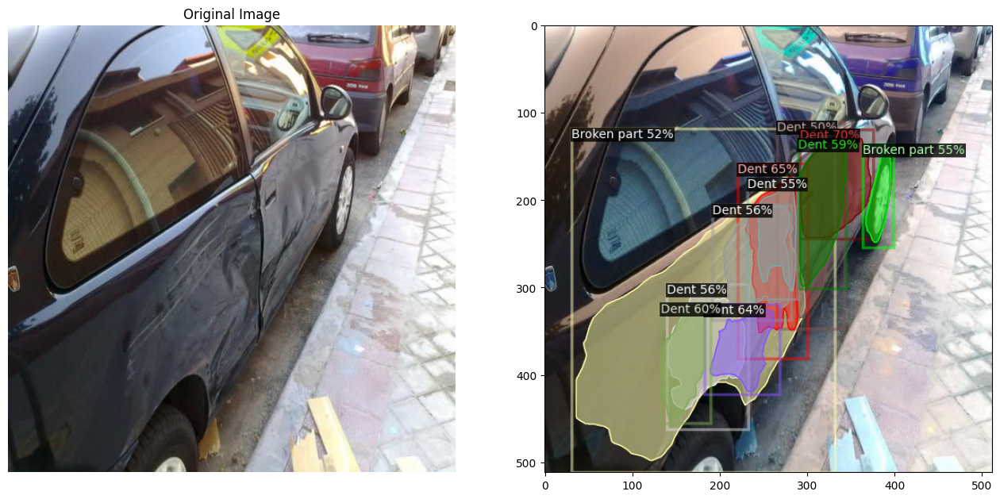

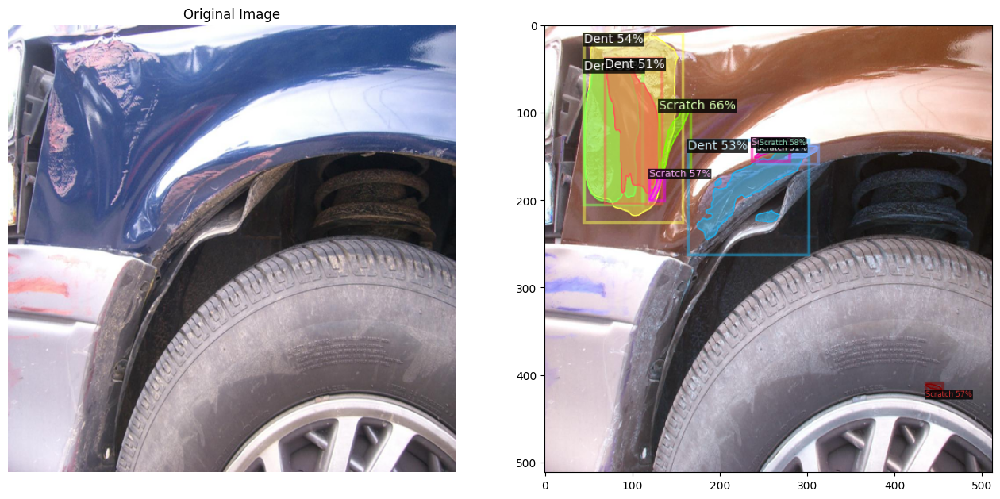

In [48]:
import glob

for img in glob.glob(f'{test_dir}*.jpg'):
  im = cv2.imread(img)
  output = predictor(im)
  # Visualize original image
  plt.subplot(1, 2, 1)
  plt.imshow(im[:, :, ::-1])
  plt.title('Original Image')
  plt.axis('off')

  # draw the predictions on the test images
  v = Visualizer(im[:, :, ::-1], metadata_dicts_hitl, scale=0.5)
  out = v.draw_instance_predictions(output["instances"].to("cpu"))

  plt.subplot(1, 2, 2)
  plt.imshow(out.get_image()[:, :, ::-1])
  plt.show()

## Test on validation data (same dataset)

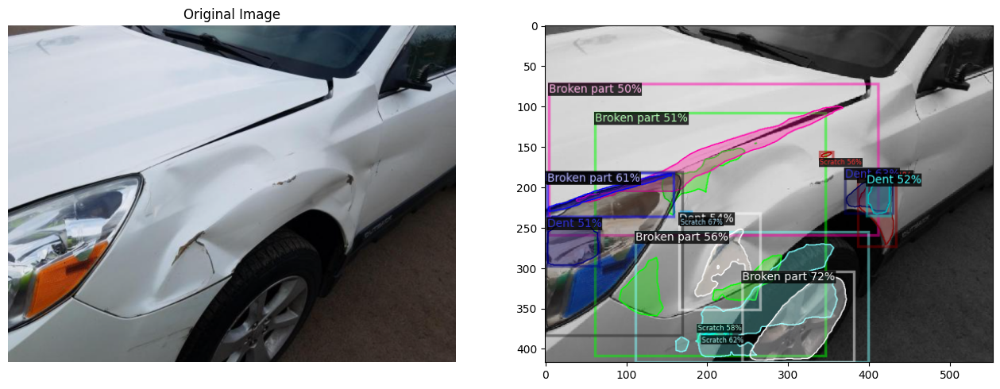

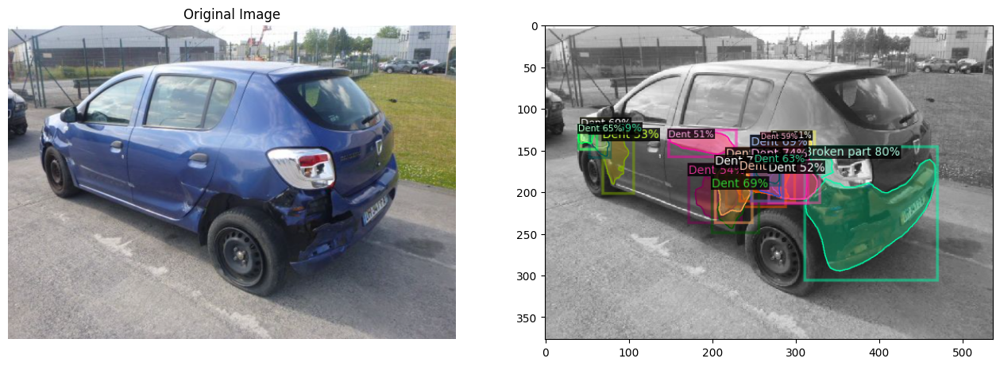

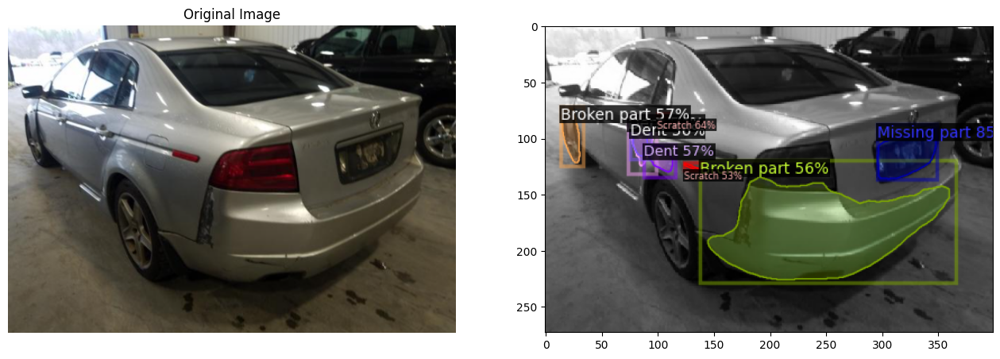

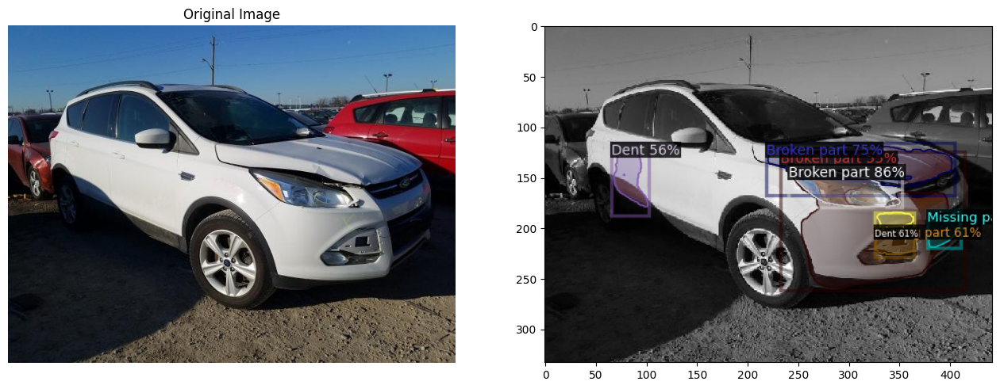

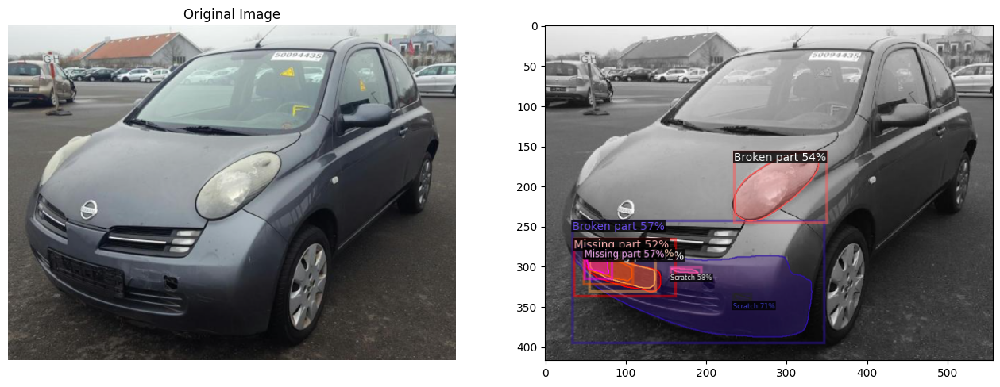

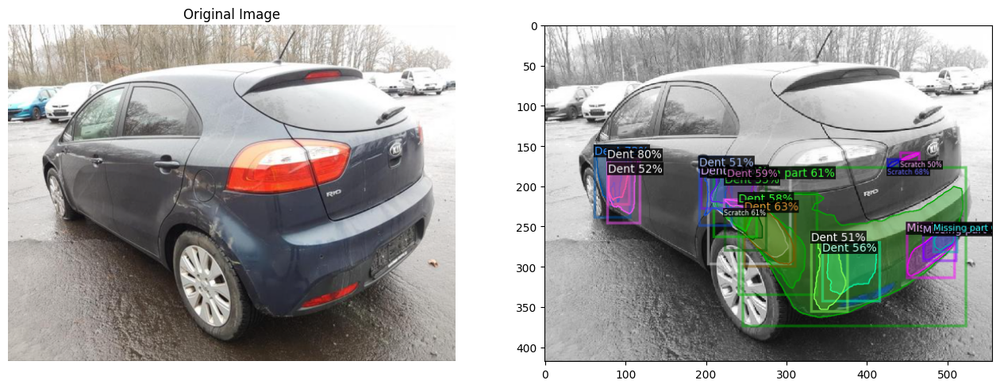

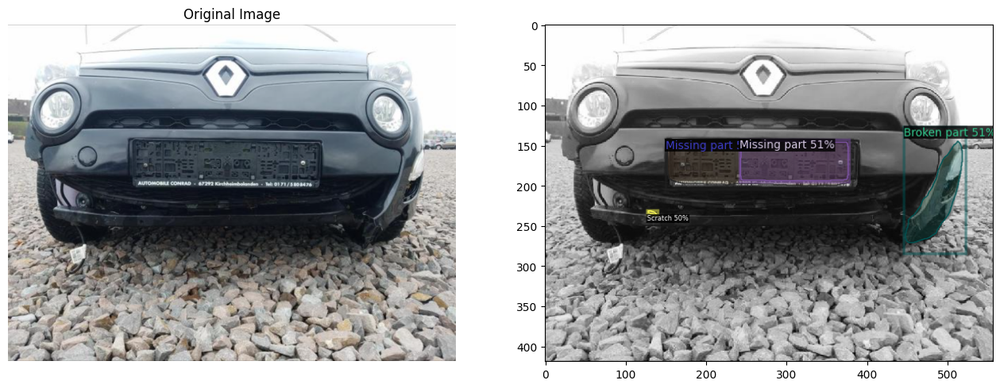

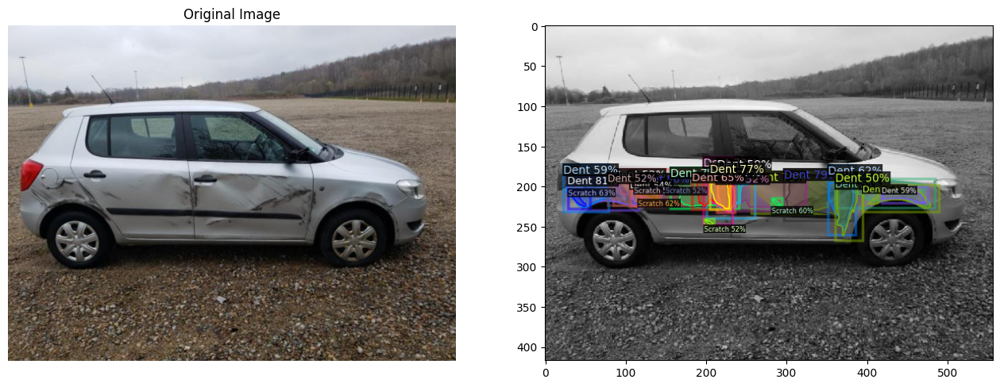

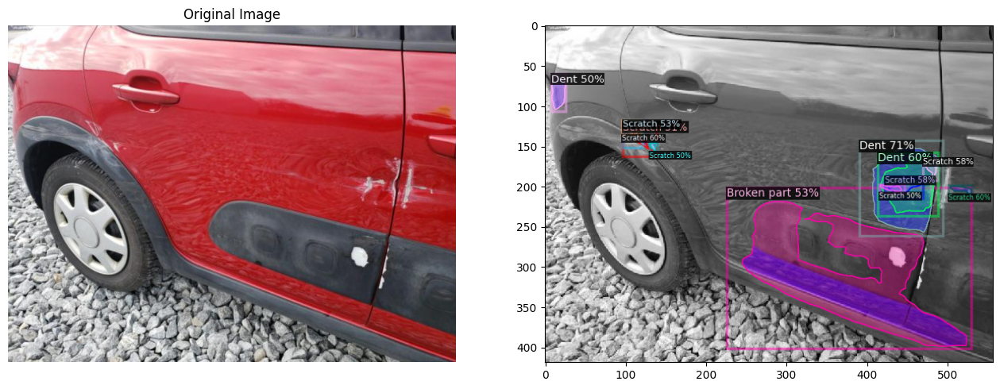

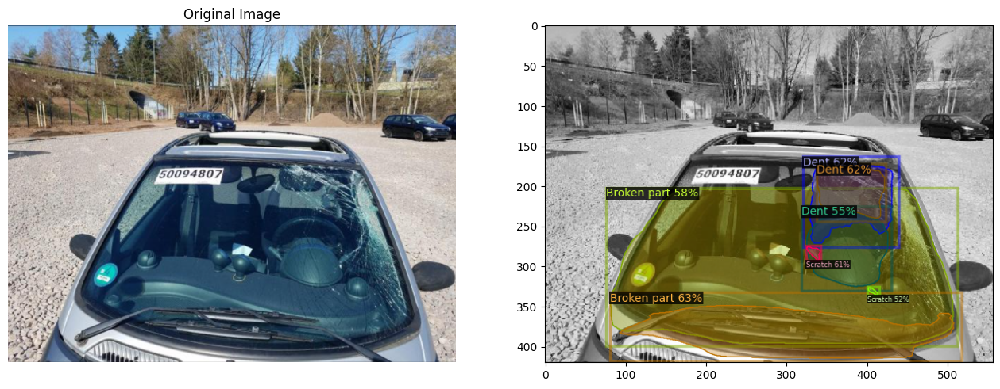

In [98]:
for d in random.sample(dataset_dicts_hitl_val, 10):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format

    # Visualize original image
    plt.subplot(1, 2, 1)
    plt.imshow(im[:, :, ::-1])
    plt.title('Original Image')
    plt.axis('off')
    
    v = Visualizer(im[:, :, ::-1],
                   metadata=metadata_dicts_hitl_val, 
                   scale=0.7, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.subplot(1, 2, 2)
    plt.imshow(out.get_image()[:, :, ::-1])
    plt.show()

## Testing through an image from a URL

C:\Users\yturki004\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\functional.py:513: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\TensorShape.cpp:3610.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


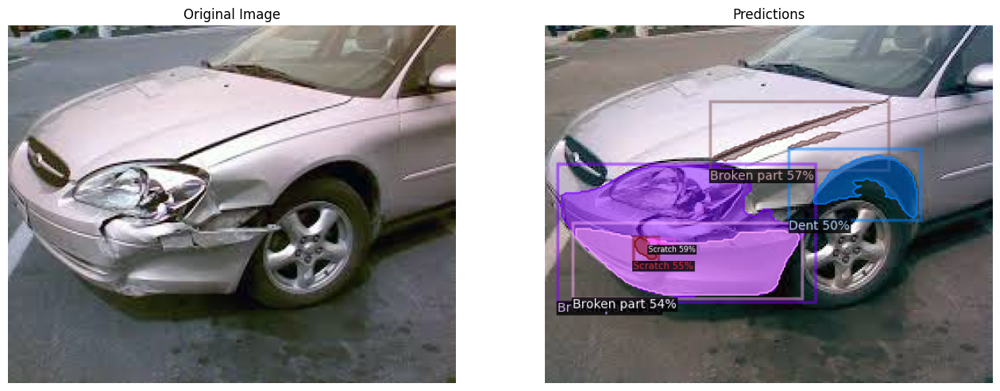

In [18]:
import requests
from PIL import Image
import numpy as np
from io import BytesIO
import cv2
import matplotlib.pyplot as plt
from detectron2.utils.visualizer import Visualizer

# Function to load an image from a URL
def load_image_from_url(url):
    response = requests.get(url)
    image = Image.open(BytesIO(response.content))
    # Convert to format suitable for OpenCV
    image = np.array(image)
    if image.ndim == 2:  # If grayscale image
        image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
    return image

# Example image URL
image_url = 'https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcSv3y5hTIgFJgWTciweKD3omEb6s0433e9eXQ&usqp=CAU'

# Load the image
im = load_image_from_url(image_url)

# Run the predictor on the image
output = predictor(im)

# Visualize original image
plt.subplot(1, 2, 1)
plt.imshow(im[:, :, ::-1])
plt.title('Original Image')
plt.axis('off')

# Draw the predictions on the test images
v = Visualizer(im[:, :, ::-1], metadata_dicts_hitl, scale=2)
out = v.draw_instance_predictions(output["instances"].to("cpu"))

plt.subplot(1, 2, 2)
plt.imshow(out.get_image()[:, :, ::-1])
plt.title('Predictions')
plt.axis('off')

plt.show()

In [27]:
indices = [3, 1, 3, 1, 3, 5]

# Access elements from classes using indices and create a set
unique_classes = {classes[i] for i in indices}

unique_classes

{'Broken part', 'Dent', 'Scratch'}

In [22]:
print(output)

{'instances': Instances(num_instances=6, image_height=201, image_width=251, fields=[pred_boxes: Boxes(tensor([[  7.1436,  77.9325, 151.7326, 155.6830],
        [ 57.8257, 120.0959,  72.6447, 124.0053],
        [ 92.6826,  42.7747, 192.5536,  81.5511],
        [ 49.7077, 118.9742,  63.7426, 133.0061],
        [ 15.4657, 110.7997, 144.1282, 153.4245],
        [136.7448,  69.5343, 210.4054, 109.4612]])), scores: tensor([0.7333, 0.5910, 0.5680, 0.5457, 0.5398, 0.5003]), pred_classes: tensor([3, 1, 3, 1, 3, 5]), pred_masks: tensor([[[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False]],

        [[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, Fa

## Evaluation metrics

In [43]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("car_dataset_hitl_val", cfg, False, output_dir=cfg.OUTPUT_DIR)
val_loader = build_detection_test_loader(cfg, "car_dataset_hitl_val")
print(inference_on_dataset(trainer.model, val_loader, evaluator))

WARNING [08/06 09:20:49 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[08/06 09:20:49 d2.data.datasets.coco]: Loaded 77 images in COCO format from working_multiclass/data/val/coco_annotations_damage.json
[08/06 09:20:49 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[08/06 09:20:49 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[08/06 09:20:49 d2.data.common]: Serializing 77 elements to byte tensors and concatenating them all ...
[08/06 09:20:49 d2.data.common]: Serialized dataset takes 0.27 MiB
[08/06 09:20:49 d2.evaluation.evaluator]: Start inference on 77 batches
[08/06 09:21:30 d2.evaluation.evaluator]: Inference done 1/77. Dataloading: 35.3011 s/iter. Inference: 5.6766 s/iter. Eval: 0.0390 s/iter. Total: 41.0178 s/